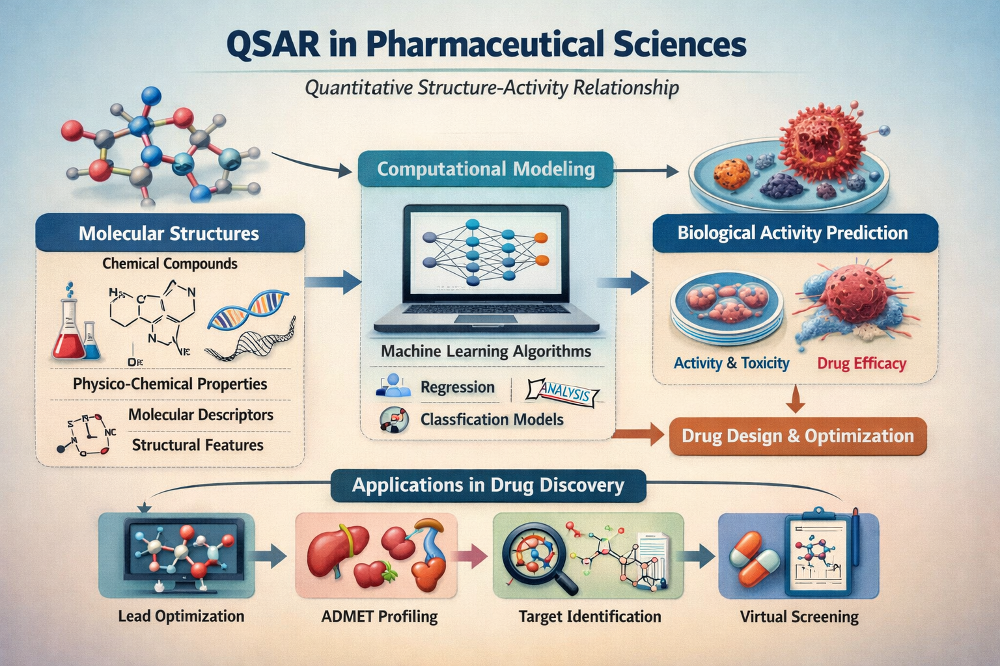

In this work , I have used the ESOL dataset from the MoleculeNet to do QSAR with three algorithms , one the Forest

# Quantitative structure-activity relationship (QSAR) in drug design

In [2]:
# Install the necessary packages if not already installed

!pip install scikit-learn pandas numpy seaborn matplotlib rdkit-pypi torch torch-geometric

In [3]:
# To construct a small space of molecules as drugs with their solubility data known in advance 

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors
from sklearn.model_selection import train_test_split

In [4]:
data = pd.DataFrame({
    "smiles": [
        "CCO",                 # ethanol
        "CC(=O)O",             # acetic acid
        "CCN(CC)CC",           # triethylamine
        "c1ccccc1",            # benzene
        "CCOC(=O)C"            # ethyl acetate
    ],
    "activity": [
        -0.3,                  # solubility valuses are taken as activity
        -0.5,
        -1.2,
        -2.8,
        -1.0
    ]
})

In [5]:
    # Convert SMILES to Molecules

data["mol"] = data["smiles"].apply(Chem.MolFromSmiles)
data

,smiles,activity,mol
0,CCO,-0.3,<rdkit.Chem.rdchem.Mol object at 0x7946523d2ce0>
1,CC(=O)O,-0.5,<rdkit.Chem.rdchem.Mol object at 0x7946523d2d50>
2,CCN(CC)CC,-1.2,<rdkit.Chem.rdchem.Mol object at 0x7946523d2dc0>
3,c1ccccc1,-2.8,<rdkit.Chem.rdchem.Mol object at 0x7946523d2e30>
4,CCOC(=O)C,-1.0,<rdkit.Chem.rdchem.Mol object at 0x7946523d2ea0>


In [6]:
# Calculate Molecular Descriptors


def calc_descriptors(mol):
    return {
        "MW": Descriptors.MolWt(mol),
        "logP": Descriptors.MolLogP(mol),
        "HBD": Descriptors.NumHDonors(mol),
        "HBA": Descriptors.NumHAcceptors(mol),
        "TPSA": Descriptors.TPSA(mol),
        "RotB": Descriptors.NumRotatableBonds(mol)
    }

In [7]:

desc_df = data["mol"].apply(calc_descriptors).apply(pd.Series)

qsar_df = pd.concat([desc_df, data["activity"]], axis=1)
qsar_df

,MW,logP,HBD,HBA,TPSA,RotB,activity
0,46.069,-0.0014,1.0,1.0,20.23,0.0,-0.3
1,60.052,0.0909,1.0,1.0,37.30,0.0,-0.5
2,101.193,1.3481,0.0,1.0,3.24,3.0,-1.2
3,78.114,1.6866,0.0,0.0,0.00,0.0,-2.8
4,88.106,0.5694,0.0,2.0,26.30,1.0,-1.0


In [8]:
# Split Features & Target

X = qsar_df.drop("activity", axis=1)
y = qsar_df["activity"]


In [9]:
# Train a QSAR Model (Linear Regression)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

model = LinearRegression()
model.fit(X_train, y_train)

preds = model.predict(X_test)

print("R2:", r2_score(y_test, preds))
print("RMSE:", mean_squared_error(y_test, preds, squared=False))

R2: nan
RMSE: 0.319873253000546


/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [10]:
# Interpret the QSAR Model

# Get feature names
feature_names = X.columns.tolist()

# Get model coefficients
coefficients = model.coef_

# Create a DataFrame for interpretation
interpretation_df = pd.DataFrame({
    "Feature": feature_names,
    "Coefficient": coefficients
})

interpretation_df.sort_values("Coefficient", key=abs, ascending=False)

,Feature,Coefficient
5,RotB,0.700633
1,logP,-0.189952
2,HBD,0.158159
3,HBA,0.132708
4,TPSA,0.037126
0,MW,-0.035495


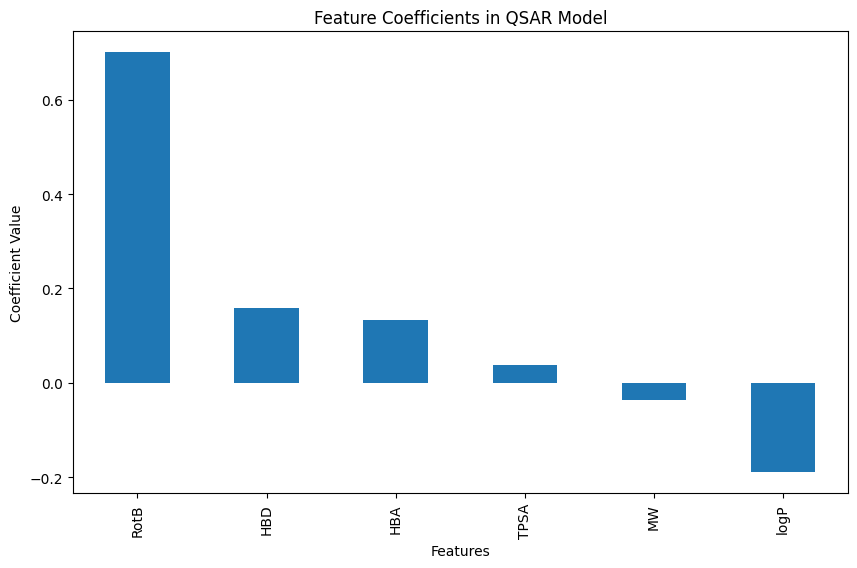

In [11]:
coefficients = pd.Series(
    model.coef_, index=X.columns
).sort_values(ascending=False)

coefficients.plot.bar(figsize=(10, 6))
plt.title("Feature Coefficients in QSAR Model")
plt.ylabel("Coefficient Value")
plt.xlabel("Features")
plt.show()

In [12]:
# Prediction Phase on a New Molecule to measure its solubility as it would be the output of the model

new_smiles = "CCOC"  # ethoxyethane
new_mol = Chem.MolFromSmiles(new_smiles)

new_desc = pd.DataFrame([calc_descriptors(new_mol)])
prediction = model.predict(new_desc)

prediction
print(f"Predicted activity (solubility) for {new_smiles}: {prediction[0]}") 

Predicted activity (solubility) for CCOC: -0.7880461674947068


In [13]:
# Hyperparameter Tuning & Cross-Validation can be added here as it makes the model more robust

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV    

In [14]:
# Definie the hyperparameter grid
param_grid = {
    "alpha": [0.001, 0.01, 0.1, 1, 10, 100]
}


In [15]:

ridge = Ridge()

grid = GridSearchCV(
    ridge,
    param_grid,
    scoring="r2",
    cv=4
)

grid.fit(X_train, y_train)


/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two

GridSearchCV(cv=4, estimator=Ridge(),
             param_grid={'alpha': [0.001, 0.01, 0.1, 1, 10, 100]},
             scoring='r2')

In [16]:
print("Best alpha:", grid.best_params_)
best_model = grid.best_estimator_
best_preds = best_model.predict(X_test) 

Best alpha: {'alpha': 0.001}


In [17]:
from sklearn.metrics import r2_score

preds = best_model.predict(X_test)
print("Test R2:", r2_score(y_test, preds))


Test R2: nan


/home/omid/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:1211: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


# QSAR method integrated with ESOL dataset from MoleculeNet dataset 

In the second part , I will apply another ML technique as Random Forest on real dataset ESOL which shows solubility of real chemical molecules! 


In [18]:
import deepchem as dc
import pandas as pd
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import Descriptors
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error        

In [19]:
# Download the dataset
tasks, datasets, transformers = dc.molnet.load_delaney(featurizer='Raw')
train, valid, test = datasets


train_dataset, valid_dataset, test_dataset = datasets
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}")
print(f"Number of test samples: {len(test_dataset)}")       

Number of training samples: 902
Number of validation samples: 113
Number of test samples: 113


In [20]:
# Extract SMILES and target values from DeepChem datasets

def extract_smiles_and_y(dataset):
    smiles = dataset.ids
    y = dataset.y.flatten()
    return smiles, y

train_smiles, y_train = extract_smiles_and_y(train_dataset)
test_smiles, y_test = extract_smiles_and_y(test_dataset)        


In [21]:

# Extract SMILES and target values from DeepChem datasets
def extract_smiles_and_y(dataset):
    smiles = dataset.ids
    y = dataset.y.flatten()
    return smiles, y

train_smiles, y_train = extract_smiles_and_y(train_dataset)
test_smiles, y_test = extract_smiles_and_y(test_dataset)


In [22]:
#   Remove entries with None molecules

train_data = [(m, y) for m, y in zip(train_mols, y_train) if m is not None]
test_data = [(m, y) for m, y in zip(test_mols, y_test) if m is not None]

train_mols, y_train = zip(*train_data)
test_mols, y_test = zip(*test_data)


NameError: name 'train_mols' is not defined

In [23]:
def calc_descriptors(mol):
    return [
        Descriptors.MolWt(mol),
        Descriptors.MolLogP(mol),
        Descriptors.NumHDonors(mol),
        Descriptors.NumHAcceptors(mol),
        Descriptors.TPSA(mol),
        Descriptors.NumRotatableBonds(mol),
        Descriptors.RingCount(mol)
    ]
# Calculate descriptors for training and test sets  
    


The dataset below is the actual dataset that will be used for the QSAR analysis 

In [24]:
X_train = pd.DataFrame([calc_descriptors(m) for m in train_mols],
                       columns=["MW", "logP", "HBD", "HBA", "TPSA", "RotB", "Rings"])

X_test = pd.DataFrame([calc_descriptors(m) for m in test_mols],
                      columns=X_train.columns)


NameError: name 'train_mols' is not defined

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score    

rf = RandomForestRegressor(
    n_estimators=200,
    random_state=42,
    n_jobs=-1
)

rf.fit(X_train, y_train)
preds = rf.predict(X_test)

print("Baseline R2:", r2_score(y_test, preds))
rmse = root_mean_squared_error(y_test, preds)
print("Baseline RMSE:", rmse)

Baseline R2: 0.8527582409305619
Baseline RMSE: 0.3935445402199786


In [ ]:
# Hyperparameter Tuning & Cross-Validation can be added here 

from sklearn.model_selection import GridSearchCV
param_grid = {
    "n_estimators": [200, 500],
    "max_depth": [None, 10, 20],
    "min_samples_leaf": [1, 3, 5],
    "max_features": ["sqrt", "log2"]
}
rf = RandomForestRegressor(random_state=42, n_jobs=-1)
grid = GridSearchCV(
    rf,
    param_grid,
    scoring="r2",
    cv=4
)
grid.fit(X_train, y_train)  

GridSearchCV(cv=4, estimator=RandomForestRegressor(n_jobs=-1, random_state=42),
             param_grid={'max_depth': [None, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 3, 5],
                         'n_estimators': [200, 500]},
             scoring='r2')

In [ ]:
print("Best parameters:", grid.best_params_)

best_rf = grid.best_estimator_
best_preds = best_rf.predict(X_test)

Best parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'n_estimators': 500}


In [ ]:
# Now evalute the tuned model 

preds = best_rf.predict(X_test)

print("Tuned R2:", r2_score(y_test, preds))
rmse = root_mean_squared_error(y_test, preds)
print("Baseline RMSE:", rmse)   


Tuned R2: 0.8373796152973783
Baseline RMSE: 0.41358605308983676


The code below shows the best features that contributed to the model 

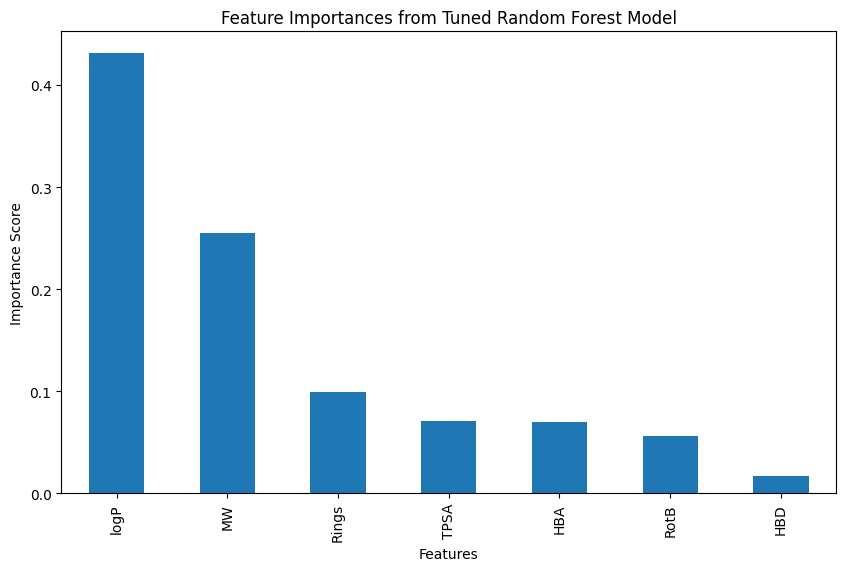

In [ ]:
importances = pd.Series(
    best_rf.feature_importances_,
    index=X_train.columns
).sort_values(ascending=False)

importances
importances.plot.bar(figsize=(10, 6))
plt.title("Feature Importances from Tuned Random Forest Model")
plt.ylabel("Importance Score")
plt.xlabel("Features")
plt.show()

# Bayesian Framework Analysis and Pipeline 

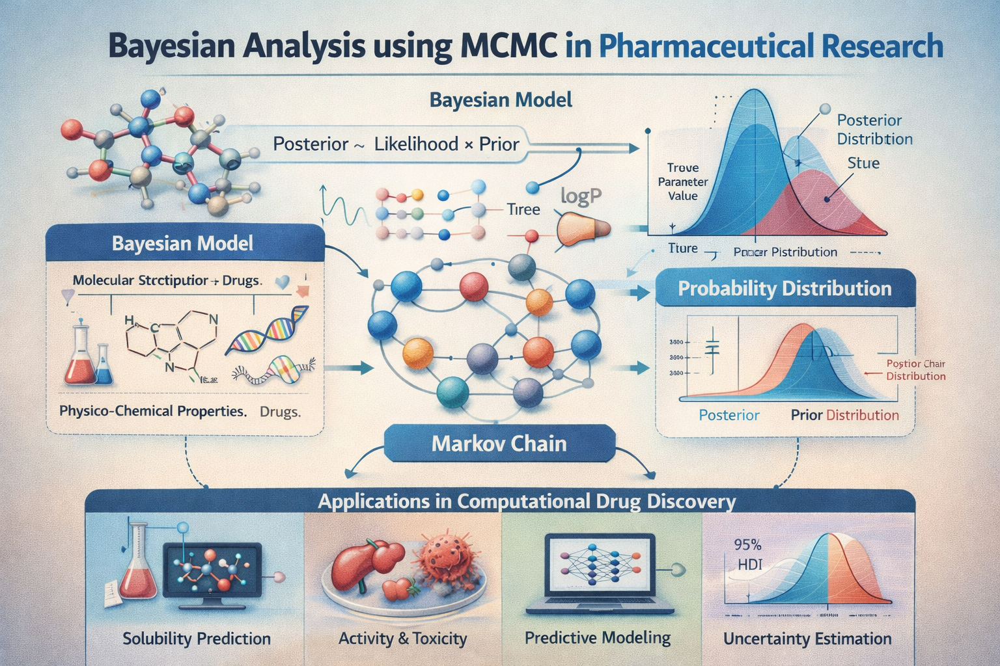

In this section , I will fit a linear regression model for the solubality of the molecules from the dataset. Here , I will assume that the solubiity 

In [25]:
# Prepare the environment and dataset for modeling  

import deepchem as dc
from rdkit import Chem              # Essential for the the integration of the chemistry with Python environment    
from rdkit.Chem import Descriptors  # Essential for molecular feature extraction
import pandas as pd     
import numpy as np

In [26]:
# Dataset loading more details can be found on the website of DeepChem  https://deepchem.readthedocs.io/en/latest/api_reference/moleculenet.html


tasks, datasets, transformers = dc.molnet.load_delaney(featurizer='Raw')
train, valid, test = datasets


train_dataset, valid_dataset, test_dataset = datasets
print(f"Number of training samples: {len(train_dataset)}")
print(f"Number of validation samples: {len(valid_dataset)}")
print(f"Number of test samples: {len(test_dataset)}") 


Number of training samples: 902
Number of validation samples: 113
Number of test samples: 113


In [27]:
def featurize(smiles):
    mol = Chem.MolFromSmiles(smiles)
    return [
        Descriptors.MolWt(mol),               # Molecular Weight extraction from molecule   
        Descriptors.MolLogP(mol),             # LogP extraction from molecule       
        Descriptors.NumHDonors(mol),          # Number of Hydrogen Bond Donors extraction from molecule 
        Descriptors.NumHAcceptors(mol),       # Number of Hydrogen Bond Acceptors extraction from molecule
        Descriptors.TPSA(mol),                # Topological Polar Surface Area extraction from molecule   
        Descriptors.NumRotatableBonds(mol),   # Number of Rotatable Bonds extraction from molecule
        Descriptors.RingCount(mol)            # Ring Count extraction from molecule
    ]


In [28]:
X_train = np.array([featurize(s) for s in train.ids])
y_train = train.y.flatten()

X_test = np.array([featurize(s) for s in test.ids])
y_test = test.y.flatten()


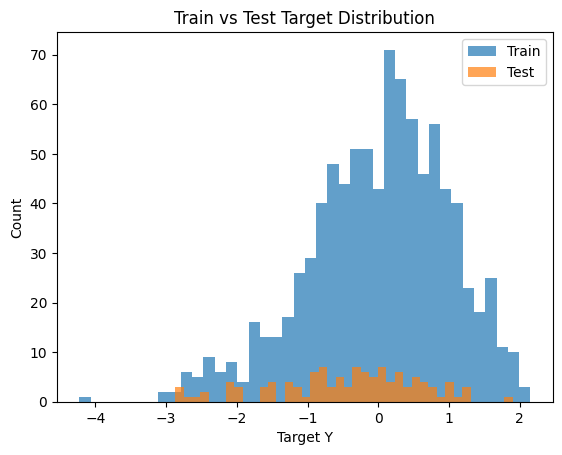

In [29]:
plt.figure()
plt.hist(y_train, bins=40, alpha=0.7, label="Train")
plt.hist(test.y.flatten(), bins=40, alpha=0.7, label="Test")
plt.xlabel("Target Y")
plt.ylabel("Count")
plt.legend()
plt.title("Train vs Test Target Distribution")
plt.show()


The above distribution of the target value which is the solubility of the molecules are an approaximate of a univariate Gaussian Distribution . In my Bayesian Model I will assume the univariate Normal DIstribution of the solubility as defined 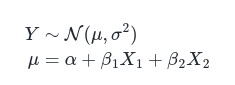

# Bayesian Pipeline 

In [30]:
import pymc as pm
import arviz as az
print(f"Running on PyMC v{pm.__version__}") 

Running on PyMC v5.25.1


Initializing NUTS using jitter+adapt_diag...
/home/omid/miniconda3/envs/chemenv/lib/python3.10/site-packages/pytensor/link/c/cmodule.py:2968: UserWarning: PyTensor could not link to a BLAS installation. Operations that might benefit from BLAS will be severely degraded.
This usually happens when PyTensor is installed via pip. We recommend it be installed via conda/mamba/pixi instead.
Alternatively, you can use an experimental backend such as Numba or JAX that perform their own BLAS optimizations, by setting `pytensor.config.mode == 'NUMBA'` or passing `mode='NUMBA'` when compiling a PyTensor function.
For more options and details see https://pytensor.readthedocs.io/en/latest/troubleshooting.html#how-do-i-configure-test-my-blas-library
  warnings.warn(
Sequential sampling (2 chains in 1 job)
NUTS: [alpha, beta, sigma]


Output()

Sampling 2 chains for 1_500 tune and 3_000 draw iterations (3_000 + 6_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


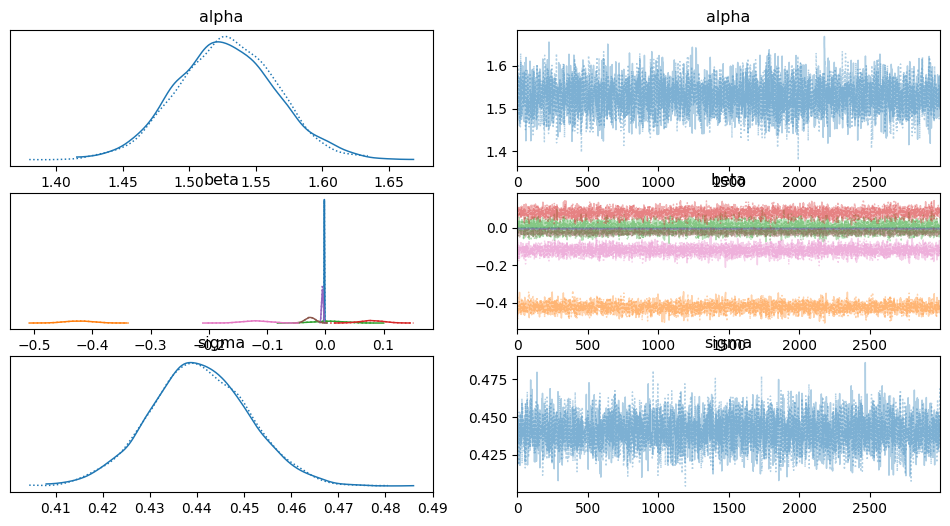

          mean     sd  hdi_3%  hdi_97%  mcse_mean  mcse_sd  ess_bulk  \
alpha    1.528  0.037   1.455    1.595      0.001      0.0    4672.0   
beta[0] -0.002  0.000  -0.002   -0.001      0.000      0.0    3628.0   
beta[1] -0.424  0.024  -0.470   -0.380      0.000      0.0    3105.0   
beta[2]  0.004  0.026  -0.046    0.051      0.000      0.0    4593.0   
beta[3]  0.081  0.021   0.041    0.119      0.000      0.0    3319.0   
beta[4] -0.005  0.001  -0.008   -0.003      0.000      0.0    3770.0   
beta[5] -0.026  0.009  -0.042   -0.009      0.000      0.0    3882.0   
beta[6] -0.120  0.022  -0.161   -0.079      0.000      0.0    4533.0   
sigma    0.440  0.010   0.422    0.461      0.000      0.0    4905.0   

         ess_tail  r_hat  
alpha      4162.0    1.0  
beta[0]    3419.0    1.0  
beta[1]    3208.0    1.0  
beta[2]    4263.0    1.0  
beta[3]    3550.0    1.0  
beta[4]    3196.0    1.0  
beta[5]    4312.0    1.0  
beta[6]    4406.0    1.0  
sigma      3995.0    1.0  


In [ ]:
Bayes_Model = pm.Model()

with Bayes_Model:

    # Priors for unknown model parameters

    alpha = pm.Normal("alpha", mu=0, sigma=10)
    beta = pm.Normal("beta", mu=0, sigma=10, shape=X_train.shape[1])
    sigma = pm.HalfNormal("sigma", sigma=1)

    # Expected value of outcome
    mu = alpha + pm.math.dot(X_train, beta)

    # Likelihood (sampling distribution) of observations
    Y_obs = pm.Normal("Y_obs", mu=mu, sigma=sigma, observed=y_train)

    # Inference
    trace = pm.sample(3000, tune=1500, chains = 2 , cores = 1 , return_inferencedata=True)   # This initiates the sampling process through MCMC to infer the posterior distributions of the model parameters
    pm.plot_trace(trace)
    plt.show()                  
    summary = az.summary(trace)
    print(summary)  

In [48]:
Y_obs

Y_obs

# Posterior Analysis for the Model Inference 

In [32]:
az.summary(trace, var_names=["beta", "sigma"])


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
beta[0],-0.002,0.000,-0.002,-0.001,0.0,0.0,3628.0,3419.0,1.0
beta[1],-0.424,0.024,-0.470,-0.380,0.0,0.0,3105.0,3208.0,1.0
beta[2],0.004,0.026,-0.046,0.051,0.0,0.0,4593.0,4263.0,1.0
beta[3],0.081,0.021,0.041,0.119,0.0,0.0,3319.0,3550.0,1.0
beta[4],-0.005,0.001,-0.008,-0.003,0.0,0.0,3770.0,3196.0,1.0
beta[5],-0.026,0.009,-0.042,-0.009,0.0,0.0,3882.0,4312.0,1.0
beta[6],-0.120,0.022,-0.161,-0.079,0.0,0.0,4533.0,4406.0,1.0
sigma,0.440,0.010,0.422,0.461,0.0,0.0,4905.0,3995.0,1.0


array([[<Axes: title={'center': 'beta\n0'}>,
        <Axes: title={'center': 'beta\n1'}>,
        <Axes: title={'center': 'beta\n2'}>],
       [<Axes: title={'center': 'beta\n3'}>,
        <Axes: title={'center': 'beta\n4'}>,
        <Axes: title={'center': 'beta\n5'}>],
       [<Axes: title={'center': 'beta\n6'}>, <Axes: >, <Axes: >]],
      dtype=object)

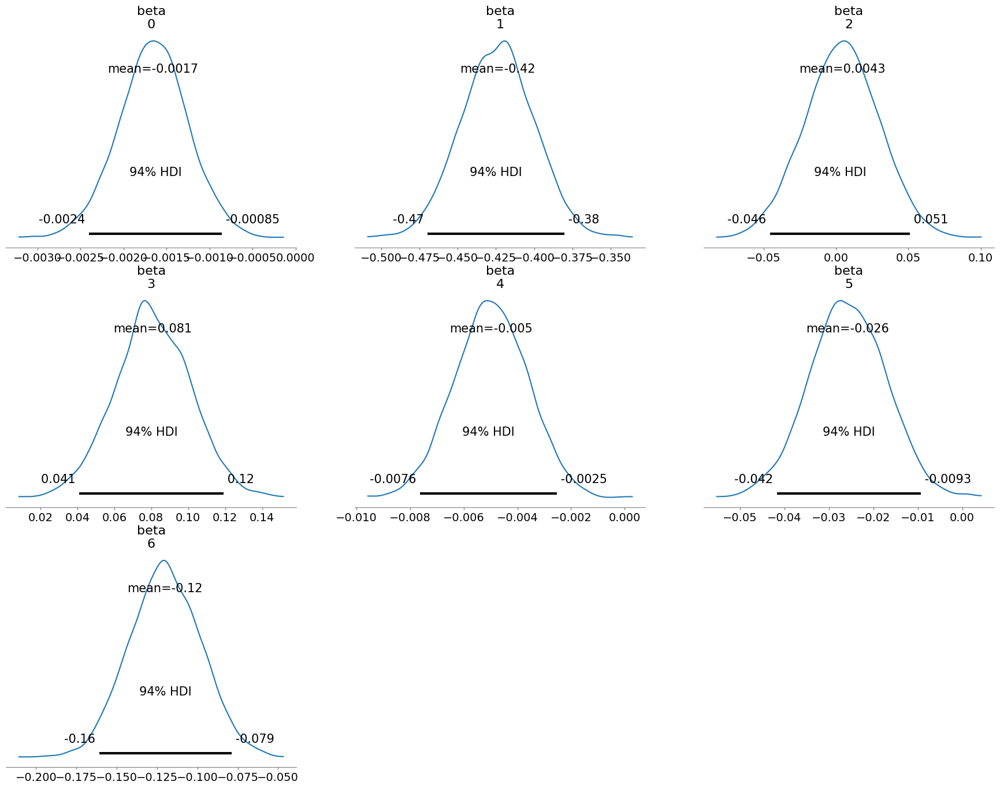

In [34]:
az.plot_posterior(trace, var_names=["beta"])


# Posterior Predictive Distribution (Uncertainty-Aware QSAR)

In [64]:
with Bayes_Model:
    posterior_pred = pm.sample_posterior_predictive(
        trace,
       return_inferencedata=True
    )

print(posterior_pred)

Sampling: [Y_obs]


Output()

Inference data with groups:
	> posterior_predictive
	> observed_data


In [53]:
print(posterior_pred)


Inference data with groups:
	> posterior_predictive
	> observed_data


In [55]:
posterior_pred.posterior_predictive.data_vars


Data variables:
    Y_obs    (chain, draw, Y_obs_dim_0) float64 43MB -0.1334 0.8011 ... 0.07454

In [56]:
Y_pred_samples = posterior_pred.posterior_predictive["Y_obs"]
y_pred_mean = Y_pred_samples.mean(dim=["chain", "draw"]).values
y_pred_std = Y_pred_samples.std(dim=["chain", "draw"]).values

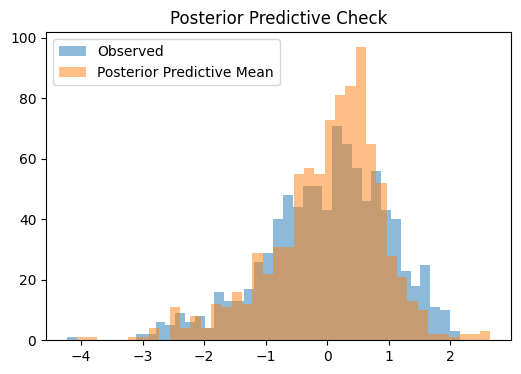

In [58]:
plt.figure(figsize=(6,4))
plt.hist(y_train, bins=40, alpha=0.5, label="Observed")
plt.hist(y_pred_mean, bins=40, alpha=0.5, label="Posterior Predictive Mean")
plt.legend()
plt.title("Posterior Predictive Check")
plt.show()


In [61]:
def gibbs_linear_qsar(X, y, n_iter=5000, tau2=100, a0=1, b0=1):
    n, p = X.shape
    beta = np.zeros(p)
    sigma2 = 1.0

    beta_samples = np.zeros((n_iter, p))
    sigma2_samples = np.zeros(n_iter)

    XtX = X.T @ X
    Xty = X.T @ y

    for i in range(n_iter):
        # β | σ², y
        Sigma_beta = np.linalg.inv(XtX / sigma2 + np.eye(p) / tau2)
        mu_beta = Sigma_beta @ (Xty / sigma2)
        beta = np.random.multivariate_normal(mu_beta, Sigma_beta)

        # σ² | β, y
        resid = y - X @ beta
        a_post = a0 + n / 2
        b_post = b0 + 0.5 * resid @ resid
        sigma2 = 1 / np.random.gamma(a_post, 1 / b_post)

        beta_samples[i] = beta
        sigma2_samples[i] = sigma2

    return beta_samples, sigma2_samples


In [62]:
beta_gibbs, sigma2_gibbs = gibbs_linear_qsar(X_train, y_train)
print("Gibbs Sampling Results:")
print("Beta Mean:", beta_gibbs.mean(axis=0))
print("Sigma^2 Mean:", sigma2_gibbs.mean()) 

Gibbs Sampling Results:
Beta Mean: [-0.00133546  0.02142049  0.2500012   0.15301523  0.00761882 -0.11697336
 -0.40857352]
Sigma^2 Mean: 0.5593486727618979
